<a href="https://colab.research.google.com/github/adimit078/medicalImageClassifier/blob/main/CatheterFinalBoundingBox.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

MOUNT DRIVE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi

Fri Jul  1 00:22:59 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

PIP INSTALL

In [ ]:
!pip install mdai
!pip install pydicom==1.4.2 --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 266 kB 36.5 MB/s 
     |████████████████████████████████| 64 kB 3.5 MB/s 
     |████████████████████████████████| 2.0 MB 63.3 MB/s 
     |████████████████████████████████| 43 kB 2.5 MB/s 
     |████████████████████████████████| 12.8 MB 19.9 MB/s 
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11447 sha256=d92c62cd226e09d451d556fbd427e2ab8a5a57712d20a68d30e97c0cf5497e59
  Stored in directory: /root/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 35.3 MB 73 kB/s 
  Attempting uninstall: pydicom
    Found existing installation: pydicom 2.3.0
    Uninstalling pydicom-2.3.0:
      Successfully uninstalled pydicom-2.3.0
ERROR: pip's 

In [ ]:
!pip install kornia

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 512 kB 33.7 MB/s 


IMPORTS

In [ ]:
import torch
import torch.nn as nn
import torch.utils.data as datasets
import torch.optim as optim
import torch.nn.functional as F

import torchvision.models as models
import torchvision.transforms as transforms
import torchvision

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import kornia
import random
from PIL import Image
import cv2
from sklearn.model_selection import train_test_split

In [ ]:
import mdai
from mdai.utils.common_utils import json_to_dataframe
from mdai.visualize import draw_box_on_image, display_annotations
from pathlib import Path
import os
from os.path import relpath
import math

In [ ]:
import copy

SET DEVICE

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Project

CREATE PROJECT

In [ ]:
PROJECT_ID = '7YNdMkqb'
ACCESS_TOKEN = 'a4b012a2de8e77f0775ac8a2a55bf1fc'

# define SHARED_DIR, the public directory that you have previously added to your gdrive in step 2
SHARED_DIR = Path("/content/drive/MyDrive/Student_Dataset")

# define PERSONAL_DIR, the personal directory that you can use to store annotations, personal notebooks, results
# create PERSONAL_DIR it if it doesn't exists
PERSONAL_DIR = Path("/content/drive/MyDrive/Catheters")
PERSONAL_DIR.mkdir(exist_ok=True)

DATA_ROOT = Path("/content/drive/MyDrive/Student_Dataset/dcm/")

In [ ]:
group_names = ["Painters", "Scientists", "Fictional", "Philosophers"]

groups = [['Monet^Claude', 'Cezanne^Paul', 'Vermeer^Jan', 'Picasso^Pablo', 'Kahlo^Frieda'],  
          ['Curie^Marie', 'Einstein^Albert', 'Franklin^Rosalind', 'Tesla^Nikolai', 'Edison^Thomas', 'Roentgen^Konrad'],
          ['Spiegel^Spike', 'Simpson^Homer', 'McClure^Troy', 'Bouvier^Selma', 'Stark^Tony'],
          ['Aristotle', 'Sartre^Jean-Paul', 'Wittgenstein^Ludwig', 'deBeauvoir^Simone', 'Socrates']]

names = [n for g in groups for n in g]

In [ ]:
mdai_client = mdai.Client(domain='stanford.md.ai', access_token=ACCESS_TOKEN)
mdai_client.project(PROJECT_ID, path=PERSONAL_DIR, annotations_only=True)

# get all the annotation files for our project and pick the most recent one
annotation_files = list(PERSONAL_DIR.glob(f"mdai_stanford_project_{PROJECT_ID}_annotations_*.json"))
annotation_files.sort(key=lambda x: os.path.getmtime(x))

print("")
print('Using this file as annotation file:', annotation_files[-1])

p = mdai.preprocess.Project(annotations_fp=annotation_files[-1], images_dir=DATA_ROOT)

Successfully authenticated to stanford.md.ai.
Using path '/content/drive/MyDrive/Catheters' for data.
Preparing annotations export for project 7YNdMkqb...                                                
Using cached annotations data for project 7YNdMkqb.
No project created. Downloaded annotations only.

Using this file as annotation file: /content/drive/MyDrive/Catheters/mdai_stanford_project_7YNdMkqb_annotations_2022-06-30-055520.json


In [ ]:
p.show_label_groups()

Label Group, Id: G_WK10kY, Name: Default group
	Labels:
	Id: L_R6vr06, Name: Erroneous

Label Group, Id: G_8On3MY, Name: Devices (Main)
	Labels:
	Id: L_5N0vP4, Name: Endotracheal Tube
	Id: L_y4mnA1, Name: Central venous catheter
	Id: L_A1yz9N, Name: Chest Tube

Label Group, Id: G_VK3BlY, Name: Devices (Secondary)
	Labels:
	Id: L_ZNAO94, Name: Pacemaker/ICD



In [ ]:
labels_dict = {
    'L_5N0vP4': 1, # Endotracheal Tube
    'L_y4mnA1': 2, # Central venous catheter
    'L_A1yz9N': 3, # Chest Tube
}

p.set_labels_dict(labels_dict)

In [ ]:
dataset = p.get_dataset_by_id('D_LJEj1l')
dataset.prepare()

# Dataset

CREATE DATASET

In [ ]:
class DataHelper(object):
    @staticmethod
    def grab_bounding_box(row, label):
        box = [row[f"{label}_center_x"], row[f"{label}_center_y"], row[f"{label}_width"], row[f"{label}_height"]]
        return box

class CatheterDataset(datasets.Dataset):
    def __init__(self, df, label, transform):
        self.df = df
        self.transform = transform
        self.label = label
    
    def __len__(self):
        return self.df.shape[0]
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        file = row["image_id"]

        image_id = os.path.join(DATA_ROOT, file)

        img = mdai.visualize.load_dicom_image(image_id, to_RGB=False, rescale=True)
        img = np.max(img) - img
        img = Image.fromarray(img)

        box = DataHelper.grab_bounding_box(row, self.label)

        img, box = self.transform((img, box))
        box = torch.tensor(box, dtype=torch.float32)

        return img.to(device), box.to(device)


#Transforms

In [ ]:
class ImgTransform(object):
    def __init__(self, transform):
        self.transform = transform
    
    def __call__(self, x):
        img, box = x
        return (self.transform(img), box)

In [ ]:
class MakeMax(object):
    def __init__(self, desired_max):
        self.dm = desired_max

    def __call__(self, x):
        x *= self.dm/torch.max(x)

        return x

In [ ]:
class CenterCrop(object):
    def __init__(self, size):
        self.size = size

    def __call__(self, x):
        img, box = x
        img_width, img_height = img.size

        x = (img_width-self.size)//2
        y = (img_height-self.size)//2

        img = img.crop((x, y, x+self.size, y+self.size))
        box[0] = (box[0]-x/img_width) * img_width/self.size
        box[1] = (box[1]-y/img_height) * img_height/self.size
        box[2] *= img_width/self.size
        box[3] *= img_height/self.size

        return (img, box)

In [ ]:
class CompleteRandomCrop(object):
    def __init__(self, max_x, max_y, min_width, min_height, percents=False):
        self.__dict__.update(locals())
        self.updated = not percents
    
    def __call__(self, inp):
        img, box = inp

        max_x = self.max_x
        max_y = self.max_y
        min_width = self.min_width
        min_height = self.min_height

        if(self.percents):
            max_x = int(self.max_x * img.size[0])
            min_width = int(self.min_width * img.size[0])
            max_y = int(self.max_y * img.size[1])
            min_height = int(self.min_height * img.size[1])

        x = random.randint(0, max_x)
        y = random.randint(0, max_y)

        img_width, img_height = img.size

        width = random.randint(min_width, img_width-x)
        height = random.randint(min_height, img_height-y)

        img = img.crop((x, y, width, height))
        box[0] = (box[0]-x/img_width)/(width/img_width)
        box[1] = (box[1]-y/img_height)/(height/img_height)

        return (img, box)

CompleteRandomCrop(0.2, 0.2, 0.8, 0.8, percents=True)((Image.fromarray(np.zeros((224, 224))), [0.5, 0.5, 0.3, 0.3]))

(<PIL.Image.Image image mode=F size=175x163 at 0x7FCABB592B50>,
 [0.44221105527638194, 0.4322916666666667, 0.3, 0.3])

In [ ]:
class RandomFlip(object):
    def __init__(self, p):
        self.p = p
    
    def __call__(self, x):
        img, box = x 
        if(random.uniform(0, 1) > self.p):
            img = img.transpose(Image.FLIP_LEFT_RIGHT)
            box[0] = 1-box[0]
        
        return (img, box)

In [ ]:
class RandomCrop(object):
    def __init__(self, size):
        self.size = size
    
    def __call__(self, x):
        img, box = x
        x = random.randint(0, img.size[0]-self.size)
        y = random.randint(0, img.size[1]-self.size)

        img_width = img.size[0]
        img_height = img.size[1]

        img = img.crop((x, y, x+self.size, y+self.size))
        box[0] = (box[0]-x/img_width)/(self.size/img_width)
        box[1] = (box[1]-y/img_height)/(self.size/img_height)

        return (img, box)

In [ ]:
class Image3Channels(object):
    def __init__(self):
        pass
    
    def __call__(self, inp):
        img, box = inp
        return (img.repeat(3, 1, 1), box)

# Train and Data

Data and Data Loader Creator

In [ ]:
def create_dataset(df, label, transforms, batch_size=16, shuffle=False, num_workers=0, **kwargs):
    data = CatheterDataset(df, label, transforms, **kwargs)
    data_loader = datasets.DataLoader(data, batch_size, shuffle=shuffle, num_workers=num_workers)

    return data, data_loader

Train Loop

In [ ]:
def basic_train_model(model, train_loader, test_loader, optimizer, criterion, acc_metric, verbose=2, best_model=None, best_acc=float("-inf"), epochs=15):
    train_losses = []
    test_losses = []

    train_accs = []
    test_accs = []

    best_model = copy.deepcopy(model) if best_model is None else best_model
    best_acc = best_acc

    for epoch in range(epochs):
        running_loss = 0
        running_acc = 0

        total = 0

        model.train()
        for i, (img, box) in enumerate(train_loader):
            optimizer.zero_grad()

            y = model(img)
            loss = criterion(y, box)
            acc = acc_metric(y, box)

            loss.backward()
            optimizer.step()

            running_loss += loss.item()*img.shape[0]
            running_acc += acc*img.shape[0]
            total += img.shape[0]

            if(verbose == 2):
              print(f"train epoch {epoch}/{epochs}, iter {i}/{len(train_loader)}, case {i*train_loader.batch_size}/{len(train_loader.dataset)}, "
            f"loss {loss.item()}, avg_loss {running_loss/total}, acc {acc}, avg_acc {running_acc/total}")
        
        train_losses.append(running_loss/total)
        train_accs.append(running_acc/total)

        if verbose > 0:
          print(f"train epoch {epoch}: avg_loss {train_losses[-1]}, avg_acc {train_accs[-1]}")

        running_loss = 0
        running_acc = 0
        total = 0

        if verbose == 2:
          print("\n")

        model.eval()
        for i, (img, box) in enumerate(test_loader):
            y = model(img)
            loss = criterion(y, box)
            acc = acc_metric(y, box)
            
            running_loss += loss.item()*img.shape[0]
            running_acc += acc*img.shape[0]
            total += img.shape[0]

            if(verbose == 2):
              print(f"test epoch {epoch}/{epochs}, iter {i}/{len(test_loader)}, case {i*test_loader.batch_size}/{len(test_loader.dataset)}, "
            f"loss {loss.item()}, avg_loss {running_loss/total}, acc {acc}, avg_acc {running_acc/total}")
        
        test_losses.append(running_loss/total)
        test_accs.append(running_acc/total)

        if(test_accs[-1] > best_acc):
            if(verbose > 1):
              print("BEST ACC")
            best_acc = test_accs[-1]
            best_model = copy.deepcopy(model)
        
        if verbose > 0:
          print(f"test epoch {epoch}: avg_loss {test_losses[-1]}, avg_acc {test_accs[-1]}")

        if verbose == 2:
          print("\n")
        
    return {"model":model, "best_model":best_model, "best_acc":best_acc, "train_losses":train_losses, "test_losses":test_losses, "train_accs":train_accs, "test_accs":test_accs}
            


            

In [ ]:
import json

def save_data(data, name):
    torch.save(data["model"], Path(str(name)+"_model.pth"))
    a = copy.deepcopy(data)
    del a["model"]
    del a["best_model"]

    if(type(a["best_acc"]) == torch.Tensor):
        a["best_acc"] = a["best_acc"].numpy().item()
        for key, value in a.items():
            if(type(value) == list and type(value[0]) == torch.Tensor):
                for i, v in enumerate(value):
                    a[key][i] = v.item()

    with open(Path(str(name)+"_data.json"), 'w') as fp:
        print(a)
        json.dump(a, fp)

In [ ]:
file_names = dataset.all_image_ids
endotracheal = []
central_venous = []
chest_tube = []

group = []
series = []
case_id = []

endotracheal_x = []
endotracheal_y = []
endotracheal_center_x = []
endotracheal_center_y = []
endotracheal_width = []
endotracheal_height = []

central_venous_x = []
central_venous_y = []
central_venous_x = []
endotracheal_center_y = []
endotracheal_width = []
endotracheal_height = []

endotracheal_x = []
endotracheal_y = []
endotracheal_center_x = []
endotracheal_center_y = []
endotracheal_width = []
endotracheal_height = []


mapped_labels = {"L_5N0vP4":endotracheal, "L_y4mnA1":central_venous, "L_A1yz9N":chest_tube}
named_labels = {"L_5N0vP4":"endotracheal", "L_y4mnA1":"central_venous", "L_A1yz9N":"chest_tube"}
classes = list(named_labels.values())
attributes_box = ["exists_box", "x", "y", "center_x", "center_y", "width", "height"]

gab = lambda field: lambda annotation: annotation["data"][field] # get attribute box
gag = lambda field: lambda annotation: annotation[field] # get attribute general
set_attribute_always = lambda annotation: 1
std_field = lambda func, field: lambda annotation: func(annotation)/field(annotation)
add_funcs = lambda f1, f2: lambda annotation: f1(annotation) + f2(annotation)
div_const = lambda f, const: lambda annotation: f(annotation)/const

box_attrib_getters = {
    "exists_box": set_attribute_always,
    "x": std_field(gab("x"), gag("width")),
    "y": std_field(gab("y"), gag("height")),
    "center_x": add_funcs(std_field(gab("x"), gag("width")), div_const(std_field(gab("width"), gag("width")), 2)),
    "center_y": add_funcs(std_field(gab("y"), gag("height")), div_const(std_field(gab("height"), gag("height")), 2)),
    "width": std_field(gab("width"), gag("width")),
    "height": std_field(gab("height"), gag("height"))
}

box_class_attribs = {}
for class_ in classes:
    for attr in attributes_box:
        box_class_attribs[class_+"_"+attr] = []

print(box_class_attribs)

for name in file_names:
    endotracheal.append(0)
    central_venous.append(0)
    chest_tube.append(0)

    ids = relpath(name, DATA_ROOT).split(os.sep)
    group.append(int(ids[0][-2:]))
    series.append(int(ids[1][-2:]))
    case_id.append(int(ids[2].rstrip(".dcm")[-6:]))

    for class_ in classes:
        for attr in attributes_box:
            box_class_attribs[class_+"_"+attr].append([])

    annotations = dataset.get_annotations_by_image_id(name) if name in dataset.image_ids else []

    for i in range(len(annotations)):
        annotation = annotations[i]
        label = annotation["labelId"]
        class_name = named_labels[label]
        mapped_labels[label][-1] = 1

        for attrib in attributes_box:
            attr_name = class_name+"_"+attrib
            box_class_attribs[attr_name][-1].append(box_attrib_getters[attrib](annotation))

for class_ in classes:
    for attr in attributes_box:
        for i, arr in enumerate(box_class_attribs[class_+"_"+attr]):
            box_class_attribs[class_+"_"+attr][i] = arr[0] if len(arr) > 0 else 0

file_names = [relpath(f, DATA_ROOT) for f in file_names]
label_data = {"image_id":file_names, "endotracheal":endotracheal, "central_venous":central_venous, "chest_tube":chest_tube}
id_data = {"group":group, "series":series, "case_id":case_id}
total_dat = {**id_data, **label_data, **box_class_attribs}

for key, value in total_dat.items():
    print(key, len(value))

df = pd.DataFrame(total_dat)
df.to_csv(os.path.join(PERSONAL_DIR, "cleaned.csv"))

In [ ]:
#df = #pd.read_csv(PERSONAL_DIR/"cleaned.csv")

In [ ]:
def binary_accuracy(preds, truths): # CHECK IF MO
    preds = preds.cpu().detach().numpy().tolist()
    truths = truths.detach().numpy().tolist()

    valid = 0
    for p, t in zip(preds, truth):
        x, y = p[:2]


In [ ]:
def test_image_on_random_example(test_data, model):
    test_img, test_label = test_data[random.randint(0, len(test_data)-1)]

    pred = model(torch.unsqueeze(test_img, 0))[0].to("cpu").detach().numpy().tolist()
    pred = [int(t*test_img.shape[1]) for t in pred]


    test_label = test_label.to("cpu").detach().numpy().tolist()
    test_label = [int(t*test_img.shape[1]) for t in test_label]
    test_img = test_img.cpu().detach()

    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(np.flip(np.rot90(test_img.transpose(0, 2), k=3), axis=1))

    # Create a Rectangle patch
    rect = patches.Rectangle((test_label[0]-test_label[2]/2, test_label[1]-test_label[3]/2), test_label[2], 
                            test_label[3], linewidth=1, edgecolor='r', facecolor='none')
    rect_2 = patches.Rectangle((pred[0]-pred[2]/2, pred[1]-pred[3]/2), pred[2], 
                            pred[3], linewidth=1, edgecolor='b', facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect)
    ax.add_patch(rect_2)    
    
    return ax

In [ ]:
def grab_annotations_image_prediction(test_data, model, folder):
    for i in range(len(test_data)):
        test_img, test_label = test_data[i]

        pred = model(torch.unsqueeze(test_img, 0))[0].to("cpu").detach().numpy().tolist()
        pred = [int(t*test_img.shape[1]) for t in pred]


        test_label = test_label.to("cpu").detach().numpy().tolist()
        test_label = [int(t*test_img.shape[1]) for t in test_label]
        test_img = test_img.cpu().detach()

        fig, ax = plt.subplots()
        plt.ion()

        # Display the image
        ax.imshow(np.flip(np.rot90(test_img.transpose(0, 2), k=3), axis=1))

        # Create a Rectangle patch
        rect = patches.Rectangle((test_label[0]-test_label[2]/2, test_label[1]-test_label[3]/2), test_label[2], 
                                test_label[3], linewidth=1, edgecolor='r', facecolor='none')
        rect_2 = patches.Rectangle((pred[0]-pred[2]/2, pred[1]-pred[3]/2), pred[2], 
                                pred[3], linewidth=1, edgecolor='b', facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)
        ax.add_patch(rect_2)
        plt.close(fig)
        fig.savefig(os.path.join(folder, f"prediction_{i}.png"))

In [ ]:
def show_random_example(test_data):
    test_img, test_label = test_data[random.randint(0, len(test_data)-1)]

    test_label = test_label.to("cpu").detach().numpy().tolist()
    test_label = [int(t*test_img.shape[1]) for t in test_label]
    test_img = test_img.cpu().detach()

    fig, ax = plt.subplots()

    # Display the image
    ax.imshow(np.flip(np.rot90(test_img.transpose(0, 2), k=3), axis=1))

    # Create a Rectangle patch
    rect = patches.Rectangle((test_label[0]-test_label[2]/2, test_label[1]-test_label[3]/2), test_label[2], 
                            test_label[3], linewidth=1, edgecolor='r', facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect)
    
    return ax

In [ ]:
flat = nn.Flatten()
def box_iou(preds, labels, mid):
    preds = [int(pr * 224) for pr in preds]#[class_*4:class_*4+4]
    labels = [int(lb * 224) for lb in labels]#[class_*4:class_*4+4]

    p = torch.zeros(224, 224)
    l = torch.zeros(224, 224)

    if(mid):
        s_x = max(0, preds[0]-preds[2]//2)
        e_x = min(223, preds[0]+preds[2]//2)
        s_y = max(0, preds[1]-preds[3]//2)
        e_y = min(223, preds[1]+preds[3]//3)

        p[s_x:e_x, s_y:e_y] = 1

        s_x = max(0, labels[0]-labels[2]//2)
        e_x = min(223, labels[0]+labels[2]//2)
        s_y = max(0, labels[1]-labels[3]//2)
        e_y = min(223, labels[1]+labels[3]//3)

        l[s_x:e_x, s_y:e_y] = 1

    else:
        p[preds[0]:preds[2], preds[1]:preds[3]] = 1
        l[labels[0]:labels[2], labels[1]:labels[3]] = 1

    p = flat(p)
    l = flat(l)

    intersection = (l * p).sum()
    A_sum = torch.sum(l * l)
    B_sum = torch.sum(p * p)
    return ((2. * intersection + 0.01) / (A_sum + B_sum + 0.01) )


def iou(preds, labels, reduce=True, mid=True):
    p = preds.to("cpu").detach().numpy().tolist()
    l = labels.to("cpu").detach().numpy().tolist()

    res = []

    for i in range(len(p)):
        res.append(box_iou(p[i], l[i], mid))
    
    if reduce:
      return sum(res)/(i+1)
    
    return res


In [ ]:
def ciou(bboxes1, bboxes2):
    bboxes1 = torch.sigmoid(bboxes1)
    bboxes2 = torch.sigmoid(bboxes2)
    rows = bboxes1.shape[0]
    cols = bboxes2.shape[0]
    cious = torch.zeros((rows, cols))
    if rows * cols == 0:
        return cious
    exchange = False
    if bboxes1.shape[0] > bboxes2.shape[0]:
        bboxes1, bboxes2 = bboxes2, bboxes1
        cious = torch.zeros((cols, rows))
        exchange = True
    w1 = torch.exp(bboxes1[:, 2])
    h1 = torch.exp(bboxes1[:, 3])
    w2 = torch.exp(bboxes2[:, 2])
    h2 = torch.exp(bboxes2[:, 3])
    area1 = w1 * h1
    area2 = w2 * h2
    center_x1 = bboxes1[:, 0]
    center_y1 = bboxes1[:, 1]
    center_x2 = bboxes2[:, 0]
    center_y2 = bboxes2[:, 1]

    inter_l = torch.max(center_x1 - w1 / 2,center_x2 - w2 / 2)
    inter_r = torch.min(center_x1 + w1 / 2,center_x2 + w2 / 2)
    inter_t = torch.max(center_y1 - h1 / 2,center_y2 - h2 / 2)
    inter_b = torch.min(center_y1 + h1 / 2,center_y2 + h2 / 2)
    inter_area = torch.clamp((inter_r - inter_l),min=0) * torch.clamp((inter_b - inter_t),min=0)

    c_l = torch.min(center_x1 - w1 / 2,center_x2 - w2 / 2)
    c_r = torch.max(center_x1 + w1 / 2,center_x2 + w2 / 2)
    c_t = torch.min(center_y1 - h1 / 2,center_y2 - h2 / 2)
    c_b = torch.max(center_y1 + h1 / 2,center_y2 + h2 / 2)

    inter_diag = (center_x2 - center_x1)**2 + (center_y2 - center_y1)**2
    c_diag = torch.clamp((c_r - c_l),min=0)**2 + torch.clamp((c_b - c_t),min=0)**2

    union = area1+area2-inter_area
    u = (inter_diag) / c_diag
    iou = inter_area / union
    v = (4 / (math.pi ** 2)) * torch.pow((torch.atan(w2 / h2) - torch.atan(w1 / h1)), 2)
    with torch.no_grad():
        S = (iou>0.5).float()
        alpha= S*v/(1-iou+v)
    cious = iou - u - alpha * v
    cious = torch.clamp(cious,min=-1.0,max = 1.0)
    if exchange:
        cious = cious.T
    return torch.sum(1-cious)

In [ ]:
def get_iou(pred, label):
  p = pred.cpu().detach().numpy().tolist()
  b = label.cpu().numpy().tolist()

  return iou(p, b, True)

In [ ]:
def get_mae_box(pred, label):
  return torch.abs(pred-label).sum().item()/4/pred.shape[0]

In [ ]:
def get_mae_center(pred, label):
  return torch.abs(pred[:,:2] - label[:, :2]).sum().item()/2/pred.shape[0]

In [ ]:
def get_in(pred, label):
  pr = pred.cpu().detach().numpy().tolist()
  bo = label.cpu().numpy().tolist()

  res = 0
  for p, b in zip(pr, bo):
    x, y = p[:2]
    res += 1 if b[0] - b[2] < x < b[0] + b[2] and b[1] - b[3] < y < b[1] + b[3] else 0
  
  return res/pred.shape[0]

In [ ]:
import tqdm
import sklearn
from collections import OrderedDict

def precision_recall_curve(y_true, pred_scores, thresholds):
    precisions = []
    recalls = []
    
    for threshold in thresholds:
        y_pred = ["positive" if score >= threshold else "negative" for score in pred_scores]

        precision = sklearn.metrics.precision_score(y_true=y_true, y_pred=y_pred, pos_label="positive")
        recall = sklearn.metrics.recall_score(y_true=y_true, y_pred=y_pred, pos_label="positive")
        
        precisions.append(precision)
        recalls.append(recall)

    return precisions, recalls

In [ ]:
class Metrics(object):
  def __init__(self, metrics):
    self.metrics = metrics

    self.train_metrics = []
    self.test_metrics = []

    self.train_losses = []
    self.test_losses = []

    self.train_counter = 0
    self.test_counter = 0

  def new_epoch(self):
    self.train_metrics.append({})
    self.test_metrics.append({})

    for key, value in self.metrics.items():
      self.train_metrics[-1][key] = 0
      self.test_metrics[-1][key] = 0

  def set_train_metrics(self, preds, labels):
    for key, value in self.metrics.items():
      a = self.metrics[key](preds, labels)
      if(type(a) == torch.Tensor):
        a = a.item()
    
      self.train_metrics[-1][key] += a*preds.shape[0] 
    self.train_counter += preds.shape[0]
  
  def set_test_metrics(self, preds, labels):
    for key, value in self.metrics.items():
      a = self.metrics[key](preds, labels)
      if(type(a) == torch.Tensor):
        a = a.item()

      self.test_metrics[-1][key] += a*preds.shape[0]
    self.test_counter += preds.shape[0]
  
  def normalize(self):
    for key, value in self.metrics.items():
      self.train_metrics[-1][key] /= self.train_counter
      self.test_metrics[-1][key] /= self.test_counter
    
    self.train_counter = 0
    self.test_counter = 0
  
  def save(self, folder, name):
    path_train = os.path.join(folder, str(name)+"_train.csv")
    path_test = os.path.join(folder, str(name)+"_test.csv")
    train_data = {}
    test_data = {}

    for key, value in self.metrics.items():
        train_data[key] = []
        test_data[key] = []

    for i in range(len(self.train_metrics)):
      for key, value in self.metrics.items():
        train_data[key].append(self.train_metrics[i][key])
        test_data[key].append(self.test_metrics[i][key])

    train_df = pd.DataFrame(train_data)
    test_df = pd.DataFrame(test_data)

    train_df.to_csv(path_train)
    test_df.to_csv(path_test)


In [ ]:
mse_loss_fn = nn.MSELoss()
def mse(preds, labels):
  return mse_loss_fn(preds, labels)

# FULL TRAINING

In [ ]:
acc_metric

<function __main__.iou>

In [ ]:
def single_training(model, train_loader, test_loader, optimizer, criterion, metrics, verbose=2, epochs=15):
  best_acc = 0
  best_model = copy.deepcopy(model)

  train_losses = []
  test_losses = []

  test_accs = []
  train_accs = []

  acc_metric = iou

  for epoch in range(epochs):
      metrics.new_epoch()

      running_loss = 0
      running_acc = 0

      total = 0

      model.train()
      for i, (img, box) in enumerate(train_loader):
          optimizer.zero_grad()

          y = model(img)
          loss = criterion(y, box)
          acc = acc_metric(y, box)

          loss.backward()
          optimizer.step()

          running_loss += loss.item()*img.shape[0]
          running_acc += acc*img.shape[0]
          total += img.shape[0]

          metrics.set_train_metrics(y, box)

          if(verbose == 2):
            print(f"train epoch {epoch}/{epochs}, iter {i}/{len(train_loader)}, case {i*train_loader.batch_size}/{len(train_loader.dataset)}, "
          f"loss {loss.item()}, avg_loss {running_loss/total}, acc {acc}, avg_acc {running_acc/total}")
      
      train_losses.append(running_loss/total)
      train_accs.append(running_acc/total)

      if verbose > 0:
        print(f"train epoch {epoch}: avg_loss {train_losses[-1]}, avg_acc {train_accs[-1]}")

      running_loss = 0
      running_acc = 0
      total = 0

      if verbose == 2:
        print("\n")

      model.eval()
      for i, (img, box) in enumerate(test_loader):
          y = model(img)
          loss = criterion(y, box)
          acc = acc_metric(y, box)

          running_loss += loss.item()*img.shape[0]
          running_acc += acc*img.shape[0]
          total += img.shape[0]

          metrics.set_test_metrics(y, box)

          if(verbose == 2):
            print(f"test epoch {epoch}/{epochs}, iter {i}/{len(test_loader)}, case {i*test_loader.batch_size}/{len(test_loader.dataset)}, "
          f"loss {loss.item()}, avg_loss {running_loss/total}, acc {acc}, avg_acc {running_acc/total}")
      
      test_losses.append(running_loss/total)
      test_accs.append(running_acc/total)

      if(test_accs[-1] > best_acc):
          if(verbose == 2):
            print("BEST ACC")
          best_acc = test_accs[-1]
          best_model = copy.deepcopy(model)
      
      if verbose > 0:
        print(f"test epoch {epoch}: avg_loss {test_losses[-1]}, avg_acc {test_accs[-1]}")

      if verbose == 2:
        print("\n")
      
      metrics.normalize()
      
  return {"model":model, "best_model":best_model, "best_acc":best_acc, "train_losses":train_losses, "test_losses":test_losses, "train_accs":train_accs, "test_accs":test_accs}
          


            

In [ ]:
def get_full_training(model_creator, train_loader, test_loader, create_optimizer, criterion, out_folder, trials=3):
  if not os.path.exists(out_folder):
    os.makedirs(out_folder)
    os.makedirs(os.path.join(out_folder, "models"))
    os.makedirs(os.path.join(out_folder, "best_models"))
    os.makedirs(os.path.join(out_folder, "test_predictions"))

  for trial in range(trials):
    print(f"doing model {out_folder}, trial {trial}/{trials}")
    metrics = Metrics({"loss": mse, "iou":iou, "mae_box":get_mae_box, "mae_center":get_mae_center, "center_in":get_in})
    model = model_creator()
    optimizer = create_optimizer(model)

    data = single_training(model, train_loader, test_loader, optimizer, criterion, metrics, verbose=1)
    metrics.save(out_folder, f"metrics_run_{trial}")

    torch.save(data["model"], os.path.join(out_folder, "models", f"run_{trial}.pth"))
    torch.save(data["best_model"], os.path.join(out_folder, "best_models", f"run_{trial}.pth"))
    if not os.path.exists(os.path.join(out_folder, "test_predictions", f"model_{trial}")):
      os.makedirs(os.path.join(out_folder, "test_predictions", f"model_{trial}"))

    grab_annotations_image_prediction(test_loader.dataset, data["best_model"], os.path.join(out_folder, "test_predictions", f"model_{trial}"))




# SETUP TRAIN AND TEST SETS

In [ ]:
df_endo = df[df.endotracheal == 1]
df_venous = df[df.central_venous == 1]
df_chest = df[df.chest_tube == 1]

In [ ]:
df_endo_train, df_endo_test = train_test_split(df_endo, train_size=0.8, random_state=11)

In [ ]:
df_venous_train, df_venous_test = train_test_split(df_venous, train_size=0.8, random_state=11)

In [ ]:
df_chest_train, df_chest_test = train_test_split(df_chest, train_size=0.8, random_state=11)

In [ ]:
df_endo.shape

(239, 29)

In [ ]:
avg_x = df_endo.endotracheal_center_x.mean()
avg_y = df_endo.endotracheal_center_y.mean()
avg_x, avg_y

(0.4950816565562885, 0.2962169841019534)

In [ ]:
df_endo[df_endo.endotracheal_center_y > avg_y]

,Unnamed: 0,group,series,case_id,image_id,endotracheal,central_venous,chest_tube,endotracheal_exists_box,endotracheal_x,...,central_venous_center_y,central_venous_width,central_venous_height,chest_tube_exists_box,chest_tube_x,chest_tube_y,chest_tube_center_x,chest_tube_center_y,chest_tube_width,chest_tube_height
6,6,3,3,1402,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,0,0,1,0.391405,...,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
37,37,3,3,1431,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,0,0,1,0.464204,...,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
46,46,3,3,1375,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,0,0,1,0.499336,...,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
65,65,3,3,1419,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,1,0,1,0.415741,...,0.318697,0.096463,0.107649,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
70,70,3,3,1446,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,0,0,1,0.407368,...,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1897,1897,17,17,4749,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,0,0,1,0.440827,...,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1957,1957,13,13,3785,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,0,0,1,0.440188,...,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2032,2032,20,20,5389,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,1,0,1,0.502436,...,0.577675,0.043673,0.095535,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2070,2070,20,20,5506,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,0,0,1,0.497762,...,0.000000,0.000000,0.000000,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


# Basic Model Resnet18 No Pretrain No Augmentation 224 x 224 No Normalization Endotracheal Tube 80% train size MSE LOSS Adam lr: 1e-4

In [ ]:
df_endo_train.shape, df_endo_test.shape

((191, 29), (48, 29))

In [ ]:
train_transform = transforms.Compose([
    ImgTransform(transforms.Resize((224, 224))),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_transform = transforms.Compose([
    ImgTransform(transforms.Resize((224, 224))),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_data, test_loader = create_dataset(df_endo_test, "endotracheal", test_transform, batch_size=8, shuffle=False)
train_data, train_loader = create_dataset(df_endo_train, "endotracheal", train_transform, batch_size=8, shuffle=True)

In [ ]:
def get_model():
  model = torchvision.models.resnet18(pretrained=False)
  model.fc = nn.Sequential(
      nn.Dropout(0.2),
      nn.Linear(model.fc.in_features, 256),
      nn.LeakyReLU(),
      nn.Linear(256, 4),
      nn.Sigmoid()
  )

  return model.to(device)

In [ ]:
get_optimizer = lambda model: optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()
acc_metric = iou
epochs = 15

In [ ]:
get_full_training(get_model, train_loader, test_loader, get_optimizer, criterion, PERSONAL_DIR/"endotracheal_basic_model")

doing model /content/drive/MyDrive/Catheters/endotracheal_basic_model, trial 0/3
train epoch 0: avg_loss 0.022784794583253522, avg_acc 0.13683220744132996
test epoch 0: avg_loss 0.010812413568298021, avg_acc 0.07742049545049667
train epoch 1: avg_loss 0.00477768708488548, avg_acc 0.13342277705669403
test epoch 1: avg_loss 0.009499130304902792, avg_acc 0.06521891802549362
train epoch 2: avg_loss 0.0035715189503983677, avg_acc 0.20796383917331696
test epoch 2: avg_loss 0.00926527256766955, avg_acc 0.13499388098716736
train epoch 3: avg_loss 0.002509318377471563, avg_acc 0.26485270261764526
test epoch 3: avg_loss 0.008584819811706742, avg_acc 0.07892696559429169
train epoch 4: avg_loss 0.0017168703866898233, avg_acc 0.3423541784286499
test epoch 4: avg_loss 0.008986234354476133, avg_acc 0.20512551069259644
train epoch 5: avg_loss 0.001716402030174489, avg_acc 0.30423176288604736
test epoch 5: avg_loss 0.007519541075453162, avg_acc 0.10986300557851791
train epoch 6: avg_loss 0.001604628847

In [ ]:
model = get_model()
data = basic_train_model(model, train_loader, test_loader, get_optimizer(model), criterion, acc_metric, epochs=epochs)


train epoch 0/15, iter 0/24, case 0/191, loss 0.08967922627925873, avg_loss 0.08967922627925873, acc 0.032318342477083206, avg_acc 0.032318342477083206
train epoch 0/15, iter 1/24, case 8/191, loss 0.06517430394887924, avg_loss 0.07742676511406898, acc 0.06336721032857895, avg_acc 0.04784277826547623
train epoch 0/15, iter 2/24, case 16/191, loss 0.060615502297878265, avg_loss 0.07182301084200542, acc 0.05088169500231743, avg_acc 0.048855751752853394
train epoch 0/15, iter 3/24, case 24/191, loss 0.053417377173900604, avg_loss 0.06722160242497921, acc 0.03989237919449806, avg_acc 0.046614907681941986
train epoch 0/15, iter 4/24, case 32/191, loss 0.03717917948961258, avg_loss 0.06121311783790588, acc 0.07420610636472702, avg_acc 0.05213315039873123
train epoch 0/15, iter 5/24, case 40/191, loss 0.028203923255205154, avg_loss 0.055711585407455765, acc 0.1781056672334671, avg_acc 0.07312857359647751
train epoch 0/15, iter 6/24, case 48/191, loss 0.030823931097984314, avg_loss 0.052156206

In [ ]:
data["best_acc"]

tensor(0.1922)

In [ ]:
save_data(data, PERSONAL_DIR/"models/resnet_nopre_noaug_nonorm_endo_MSE_adam_1e-4")

{'best_acc': 0.22374866902828217, 'train_losses': [0.22014996545234075, 0.039425177266821265, 0.02735399315133691, 0.02006167161744088, 0.015878169040661305, 0.01809863990638405, 0.013226306521877026, 0.009767581703878628, 0.010217255029904967, 0.011303317621544315, 0.013349536505605405, 0.012294706306420267, 0.011727690100087784, 0.00876537945199137, 0.009503171543959374], 'test_losses': [0.008668341441079974, 0.010672048898413777, 0.007670582892994086, 0.007902889396063983, 0.008238460325325528, 0.008018828773250183, 0.008173551022385558, 0.009683782933279872, 0.00878263711153219, 0.008020651914800206, 0.014123495512952408, 0.009856664963687459, 0.008531127745906511, 0.0075329246853167815, 0.008055727346800268], 'train_accs': [1.0830719470977783, 1.0589567422866821, 1.7865968942642212, 1.9829899072647095, 2.3741683959960938, 2.155683755874634, 2.477654218673706, 2.761507749557495, 2.4718177318573, 2.5034492015838623, 2.105421781539917, 2.3880655765533447, 2.335099458694458, 2.9838960

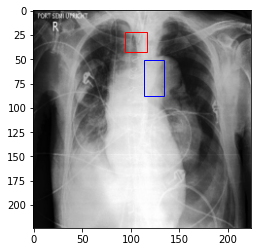

In [ ]:
test_image_on_random_example(test_data, data["model"])

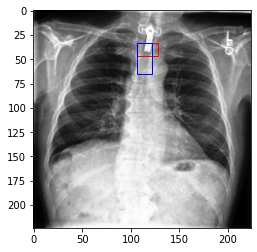

In [ ]:
test_image_on_random_example(test_data, data["best_model"])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


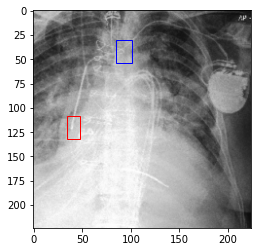

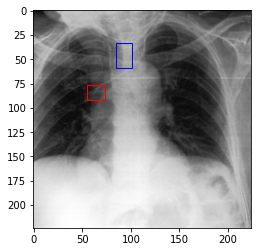

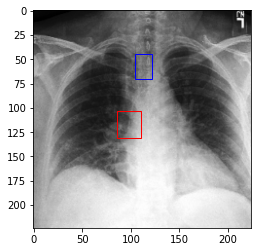

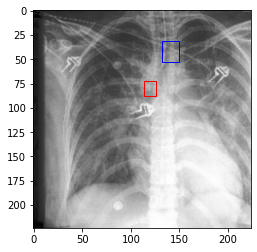

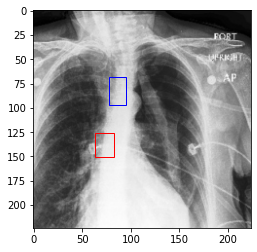

...

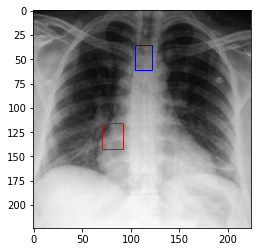

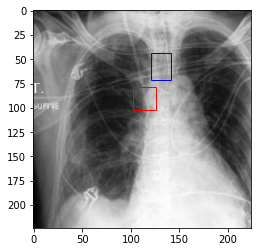

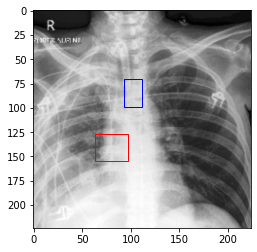

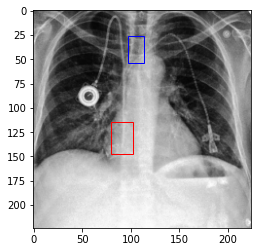

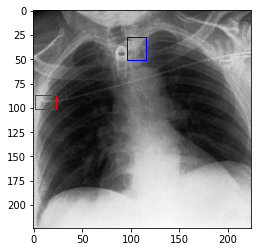

In [ ]:
grab_annotations_image_prediction(test_data, data["best_model"], PERSONAL_DIR/"endotracheal_resize")

In [ ]:
df_endo_train.shape, df_endo_test.shape

((191, 29), (48, 29))

In [ ]:
train_transform = transforms.Compose([
    ImgTransform(transforms.Resize((224, 224))),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_transform = transforms.Compose([
    ImgTransform(transforms.Resize((224, 224))),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_data, test_loader = create_dataset(df_endo_test, "endotracheal", test_transform, batch_size=16, shuffle=False)
train_data, train_loader = create_dataset(df_endo_train, "endotracheal", train_transform, batch_size=16, shuffle=True)

In [ ]:
model = torchvision.models.resnet18(pretrained=False)
model.fc = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(model.fc.in_features, 256),
    nn.LeakyReLU(),
    nn.Linear(256, 4),
    nn.Sigmoid()
)

model = model.to(device)

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = ciou
acc_metric = iou
epochs = 15

In [ ]:
best_acc = float("-inf")
best_model = copy.deepcopy(model)

In [ ]:
data = basic_train_model(model, train_loader, test_loader, optimizer, criterion, acc_metric, best_model=best_model, best_acc=best_acc, epochs=epochs)

train epoch 0/15, iter 0/12, case 0/191, loss 3.2873892784118652, avg_loss 3.2873892784118652, acc 0.027274981141090393, avg_acc 0.027274981141090393
train epoch 0/15, iter 1/12, case 16/191, loss 3.0438170433044434, avg_loss 3.1656031608581543, acc 0.03929968550801277, avg_acc 0.03328733146190643
train epoch 0/15, iter 2/12, case 32/191, loss 2.8619606494903564, avg_loss 3.0643889904022217, acc 0.038121096789836884, avg_acc 0.03489858657121658
train epoch 0/15, iter 3/12, case 48/191, loss 2.5943689346313477, avg_loss 2.946883976459503, acc 0.05244641378521919, avg_acc 0.03928554430603981
train epoch 0/15, iter 4/12, case 64/191, loss 2.457087516784668, avg_loss 2.848924684524536, acc 0.0473790243268013, avg_acc 0.04090424254536629
train epoch 0/15, iter 5/12, case 80/191, loss 2.1022191047668457, avg_loss 2.724473754564921, acc 0.09345044940710068, avg_acc 0.049661945551633835
train epoch 0/15, iter 6/12, case 96/191, loss 2.0643529891967773, avg_loss 2.6301707880837575, acc 0.051635

In [ ]:
save_data(data, "resnet_nopre_noaug_nonorm_endo_CIOU_Adam_1e-4")

{'best_acc': 0.20640020072460175, 'train_losses': [34.965081671873726, 12.266877204179764, 9.592841282486916, 8.542033602794012, 7.262898157040278, 6.789243136843045, 6.65705077846845, 6.4320137947797775, 6.58596729238828, 6.283948694666226, 5.635448858141899, 5.594548553228378, 5.088786731163661, 5.413005635142326, 5.222812369465828], 'test_losses': [1.8959670861562092, 0.8685435652732849, 0.7934375206629435, 0.7618294755617777, 0.6925517519315084, 0.7081973950068156, 0.7529091835021973, 0.6616241733233134, 0.6583618720372518, 0.6805880069732666, 0.6904231707255045, 0.6766257882118225, 0.7284563978513082, 0.6658233205477396, 0.7451542814572653], 'train_accs': [0.8956670165061951, 2.5696799755096436, 2.176132917404175, 2.77956485748291, 4.239512920379639, 5.0222954750061035, 4.810622692108154, 5.052430152893066, 4.678207874298096, 5.345081329345703, 5.7746901512146, 5.703926086425781, 6.126145839691162, 5.5716872215271, 5.736273288726807], 'test_accs': [0.04466615617275238, 0.122564993

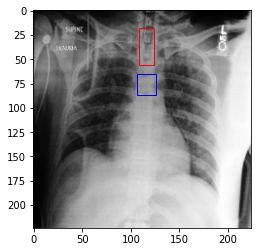

In [ ]:
test_image_on_random_example(test_data, data["model"])

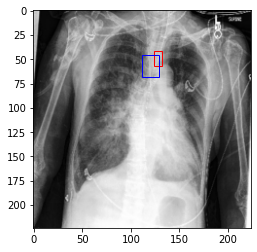

In [ ]:
test_image_on_random_example(test_data, data["best_model"])

# Model Resnet No Pretrain Random Crop 224 square 224x224 No Normalization Endotracheal Tube 80% train size CIOU Loss Adam Lr: 1e-4


In [ ]:
df_endo_train.shape, df_endo_test.shape

((191, 29), (48, 29))

In [ ]:
train_transform = transforms.Compose([
    ImgTransform(transforms.Resize(256)),
    RandomCrop(224),
    ImgTransform(transforms.ColorJitter(0.2, 0.2, 0.2, 0.2)),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_transform = transforms.Compose([
    ImgTransform(transforms.Resize(256)),
    CenterCrop(224),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_data, test_loader = create_dataset(df_endo_test, "endotracheal", test_transform, batch_size=8, shuffle=False)
train_data, train_loader = create_dataset(df_endo_train, "endotracheal", train_transform, batch_size=8, shuffle=True)

In [ ]:
model = torchvision.models.resnet18(pretrained=False)
model.fc = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(model.fc.in_features, 256),
    nn.LeakyReLU(),
    nn.Linear(256, 4),
    nn.Sigmoid()
)

model = model.to(device)

In [ ]:
def get_model():
  model = torchvision.models.resnet18(pretrained=False)
  model.fc = nn.Sequential(
      nn.Dropout(0.2),
      nn.Linear(model.fc.in_features, 256),
      nn.LeakyReLU(),
      nn.Linear(256, 4),
      nn.Sigmoid()
  )

  return model.to(device)

get_optimizer = lambda model: optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()
acc_metric = iou
epochs = 15

In [ ]:
get_full_training(get_model, train_loader, test_loader, get_optimizer, criterion, PERSONAL_DIR/"endotreacheal_square_crop_model")

doing model /content/drive/MyDrive/Catheters/endotreacheal_square_crop_model, trial 0/3
train epoch 0: avg_loss 0.038601102049009024, avg_acc 0.04645309969782829
test epoch 0: avg_loss 0.012631125437716642, avg_acc 0.06389912217855453
train epoch 1: avg_loss 0.00994213799219481, avg_acc 0.0615868978202343
test epoch 1: avg_loss 0.01343423780053854, avg_acc 0.043981894850730896
train epoch 2: avg_loss 0.009061446996083902, avg_acc 0.07000439614057541
test epoch 2: avg_loss 0.011120538149649898, avg_acc 0.12823764979839325
train epoch 3: avg_loss 0.00858742035730347, avg_acc 0.09117326885461807
test epoch 3: avg_loss 0.010601710062474012, avg_acc 0.12543746829032898
train epoch 4: avg_loss 0.007795267202038103, avg_acc 0.09847347438335419
test epoch 4: avg_loss 0.012004754661271969, avg_acc 0.0657844990491867
train epoch 5: avg_loss 0.007040200908595199, avg_acc 0.100493885576725
test epoch 5: avg_loss 0.011503020146240791, avg_acc 0.14817912876605988
train epoch 6: avg_loss 0.0078014375

In [ ]:
best_acc = float("-inf")
best_model = copy.deepcopy(model)

In [ ]:
data = basic_train_model(model, train_loader, test_loader, optimizer, criterion, acc_metric, best_model=best_model, best_acc=best_acc, epochs=epochs)

train epoch 0/15, iter 0/24, case 0/191, loss 1.4435863494873047, avg_loss 1.4435863494873047, acc 0.046098001301288605, avg_acc 0.046098001301288605
train epoch 0/15, iter 1/24, case 8/191, loss 1.4184658527374268, avg_loss 1.4310261011123657, acc 0.032392457127571106, avg_acc 0.039245229214429855
train epoch 0/15, iter 2/24, case 16/191, loss 1.2930357456207275, avg_loss 1.3850293159484863, acc 0.04022558778524399, avg_acc 0.03957201540470123
train epoch 0/15, iter 3/24, case 24/191, loss 1.251027226448059, avg_loss 1.3515287935733795, acc 0.02371695637702942, avg_acc 0.03560825064778328
train epoch 0/15, iter 4/24, case 32/191, loss 1.2215873003005981, avg_loss 1.3255404949188232, acc 0.021423837170004845, avg_acc 0.03277136757969856
train epoch 0/15, iter 5/24, case 40/191, loss 1.0385640859603882, avg_loss 1.2777110934257507, acc 0.05594585835933685, avg_acc 0.03663378208875656
train epoch 0/15, iter 6/24, case 48/191, loss 1.0209531784057617, avg_loss 1.241031391280038, acc 0.041

In [ ]:
save_data(data, PERSONAL_DIR/"models/resnet_nopre_withsquarecrop_nonorm_endo_CIOU_Adam_1e-4")

{'best_acc': 0.22235627472400665, 'train_losses': [5.994487834473451, 3.487556199232737, 3.112088402112325, 3.0338737592101097, 2.9838222662607827, 3.0360525051752725, 2.753985327978929, 2.822251357138157, 2.6627255777517953, 2.645313449203968, 2.7506875743468604, 2.563391514122486, 2.638190135359764, 2.5566122084856033, 2.538701410094897], 'test_losses': [0.5161623954772949, 0.4484983483950297, 0.3915621240933736, 0.4144330124060313, 0.4145611822605133, 0.38891204198201496, 0.44301509857177734, 0.3972744146982829, 0.42422090967496234, 0.4595936636130015, 0.4084757665793101, 0.4360967477162679, 0.41312334934870404, 0.40260974566141766, 0.38511990507443744], 'train_accs': [0.5480759739875793, 0.7075546383857727, 0.6782020926475525, 0.788459300994873, 0.8762275576591492, 0.8111958503723145, 1.1430950164794922, 1.076656460762024, 1.1961860656738281, 1.0886527299880981, 0.9817550778388977, 1.3028167486190796, 1.0832935571670532, 1.2032612562179565, 1.2406290769577026], 'test_accs': [0.1323

FileNotFoundError: ignored

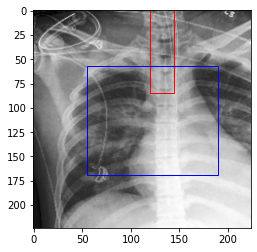

In [ ]:
grab_annotations_image_prediction(test_data, best_model, PERSONAL_DIR/"endo_tracheal_square_crop")

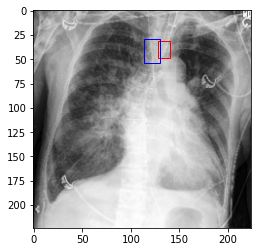

In [ ]:
test_image_on_random_example(test_data, data["model"])

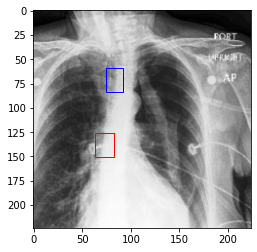

In [ ]:
test_image_on_random_example(test_data, best_model)

# Best Model Central Venous

In [ ]:
df_venous_train

,Unnamed: 0,group,series,case_id,image_id,endotracheal,central_venous,chest_tube,endotracheal_exists_box,endotracheal_x,...,central_venous_center_y,central_venous_width,central_venous_height,chest_tube_exists_box,chest_tube_x,chest_tube_y,chest_tube_center_x,chest_tube_center_y,chest_tube_width,chest_tube_height
1335,1335,19,19,5143,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.636799,0.162756,0.165527,0,0.0,0.0,0.0,0.0,0.0,0.0
1042,1042,15,15,4188,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.441411,0.061608,0.093288,0,0.0,0.0,0.0,0.0,0.0,0.0
1386,1386,19,19,5198,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.288646,0.086429,0.134063,0,0.0,0.0,0.0,0.0,0.0,0.0
633,633,1,1,988,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.352941,0.101646,0.158687,0,0.0,0.0,0.0,0.0,0.0,0.0
335,335,6,6,2275,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.638520,0.071620,0.081594,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1303,1303,19,19,5115,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,1,1,0,1,0.440907,...,0.312856,0.051472,0.106940,0,0.0,0.0,0.0,0.0,0.0,0.0
1049,1049,15,15,4250,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.324232,0.081211,0.084187,0,0.0,0.0,0.0,0.0,0.0,0.0
1323,1323,19,19,5122,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.344710,0.075967,0.100114,0,0.0,0.0,0.0,0.0,0.0,0.0
395,395,6,6,2215,1.3.6.1.4.1.1337.100.1.1.133739700003601752342...,0,1,0,0,0.000000,...,0.480076,0.106262,0.193548,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_venous_train.central_venous_center_x.mean(), df_venous_train.central_venous_center_y.mean()

(0.4588037431519255, 0.45937216245182955)

In [ ]:
mx, my = df_venous_train.central_venous_center_x.mean(), df_venous_train.central_venous_center_y.mean()

In [ ]:
df_venous_train = df_venous_train[np.abs(df_venous_train.central_venous_center_x - mx) < 0.35]

In [ ]:
df_venous_train = df_venous_train[np.abs(df_venous_train.central_venous_center_y - my) < 0.35]

In [ ]:
df_venous_train.shape, df_venous_test.shape

((417, 29), (107, 29))

In [ ]:
train_transform = transforms.Compose([
  #  ImgTransform(transforms.Resize(256)),
    ImgTransform(transforms.Resize((224, 224))),
  #  ImgTransform(transforms.RandomRotation(8)),
    RandomCrop(224),
  #  ImgTransform(transforms.ColorJitter(0.2, 0.2, 0.2, 0.2)),
 #   RandomFlip(0.5),
    #ImgTransform(transforms.GaussianBlur(3)),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_transform = transforms.Compose([
   # ImgTransform(transforms.Resize(256)),
    ImgTransform(transforms.Resize((224, 224))),

 #   CenterCrop(224),
   # ImgTransform(transforms.GaussianBlur(3)),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_data, test_loader = create_dataset(df_venous_test, "central_venous", test_transform, batch_size=8, shuffle=False)
train_data, train_loader = create_dataset(df_venous_train, "central_venous", train_transform, batch_size=8, shuffle=True)

In [ ]:
def get_model():
  model = torchvision.models.resnet18(pretrained=False)
  model.fc = nn.Sequential(
      nn.Dropout(0.2),
      nn.Linear(model.fc.in_features, 256),
      nn.LeakyReLU(),
      nn.Linear(256, 4),
      nn.Sigmoid()
  )

  return model.to(device)

get_optimizer = lambda model: optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()
acc_metric = iou
epochs = 15

In [ ]:
get_full_training(get_model, train_loader, test_loader, get_optimizer, criterion, PERSONAL_DIR/"central_venous_basic_model")

doing model /content/drive/MyDrive/Catheters/central_venous_basic_model, trial 0/3
train epoch 0: avg_loss 0.014719095464675225, avg_acc 0.0985460877418518
test epoch 0: avg_loss 0.006457826227088955, avg_acc 0.12192662060260773
train epoch 1: avg_loss 0.00535046038992828, avg_acc 0.12952597439289093
test epoch 1: avg_loss 0.006509333753209805, avg_acc 0.10700639337301254
train epoch 2: avg_loss 0.0037737407138664944, avg_acc 0.15937621891498566
test epoch 2: avg_loss 0.007863978045844586, avg_acc 0.1156223863363266
train epoch 3: avg_loss 0.0031640924294468026, avg_acc 0.17259496450424194
test epoch 3: avg_loss 0.009600175945001227, avg_acc 0.05374711751937866
train epoch 4: avg_loss 0.002688468361889823, avg_acc 0.17978018522262573
test epoch 4: avg_loss 0.006945303745707062, avg_acc 0.08661641925573349
train epoch 5: avg_loss 0.0022670444440570097, avg_acc 0.20882895588874817
test epoch 5: avg_loss 0.007043630145838328, avg_acc 0.10117040574550629
train epoch 6: avg_loss 0.002085780

In [ ]:
model = torchvision.models.resnet18(pretrained=False)
model.fc = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(model.fc.in_features, 512),
    nn.LeakyReLU(),
    nn.Linear(512, 4),
    nn.Sigmoid()
)

model = model.to(device)

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()
acc_metric = iou
epochs = 15

In [ ]:
best_acc = float("-inf")
best_model = copy.deepcopy(model)

In [ ]:
train_losses = []
test_losses = []

train_accs = []
test_accs = []

best_model = copy.deepcopy(model) if best_model is None else best_model
best_acc = best_acc

for epoch in range(epochs):
    running_loss = 0
    running_acc = 0

    total = 0

    model.train()
    for i, (img, box) in enumerate(train_loader):
        optimizer.zero_grad()

        y = model(img)
        loss = criterion(y, box)
        acc = acc_metric(y, box)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()*img.shape[0]
        running_acc += acc*img.shape[0]
        total += img.shape[0]

        print(f"train epoch {epoch}/{epochs}, iter {i}/{len(train_loader)}, case {i*train_loader.batch_size}/{len(train_loader.dataset)}, "
        f"loss {loss.item()}, avg_loss {running_loss/total}, acc {acc}, avg_acc {running_acc/total}")
    
    train_losses.append(running_loss/len(train_loader))
    train_accs.append(running_acc/len(train_loader))

    running_loss = 0
    running_acc = 0
    total = 0

    print("\n")

    model.eval()
    for i, (img, box) in enumerate(test_loader):
        y = model(img)
        loss = criterion(y, box)
        acc = acc_metric(y, box)

        running_loss += loss.item()*img.shape[0]
        running_acc += acc*img.shape[0]
        total += img.shape[0]

        print(f"test epoch {epoch}/{epochs}, iter {i}/{len(test_loader)}, case {i*test_loader.batch_size}/{len(test_loader.dataset)}, "
        f"loss {loss.item()}, avg_loss {running_loss/total}, acc {acc}, avg_acc {running_acc/total}")
    
    test_losses.append(running_loss/total)
    test_accs.append(running_acc/total)

    if(test_accs[-1] > best_acc):
        print("BEST ACC")
        best_acc = test_accs[-1]
        best_model = copy.deepcopy(model)
    
    print(f"test epoch {epoch}: avg_loss {test_losses[-1]}, avg_acc {test_accs[-1]}")

    print("\n")

train epoch 0/15, iter 0/54, case 0/425, loss 0.08854144811630249, avg_loss 0.08854144811630249, acc 0.04059886559844017, avg_acc 0.04059886559844017
train epoch 0/15, iter 1/54, case 8/425, loss 0.07848143577575684, avg_loss 0.08351144194602966, acc 0.044300779700279236, avg_acc 0.04244982451200485
train epoch 0/15, iter 2/54, case 16/425, loss 0.05098715424537659, avg_loss 0.07267001271247864, acc 0.05018085613846779, avg_acc 0.045026835054159164
train epoch 0/15, iter 3/54, case 24/425, loss 0.03919228911399841, avg_loss 0.06430058181285858, acc 0.10555551201105118, avg_acc 0.06015900522470474
train epoch 0/15, iter 4/54, case 32/425, loss 0.03562554717063904, avg_loss 0.058565574884414676, acc 0.060816440731287, avg_acc 0.060290493071079254
train epoch 0/15, iter 5/54, case 40/425, loss 0.037202052772045135, avg_loss 0.05500498786568642, acc 0.036372918635606766, avg_acc 0.05630423128604889
train epoch 0/15, iter 6/54, case 48/425, loss 0.01773209497332573, avg_loss 0.0496802888810

In [ ]:
best_acc

tensor(0.1569)

In [ ]:
data = {"model": model, "best_model":best_model, "train_losses":train_losses, "test_losses":test_losses, "train_accs":train_accs, "test_accs":test_accs, "best_acc":best_acc}

In [ ]:
save_data(data, PERSONAL_DIR/"central_venous_square_crop_withrot_wthjit_model_adam_1e-4_full_data")

{'train_losses': [0.14364129782619853, 0.08381419339113766, 0.08205836104160105, 0.0796809416540243, 0.07968231250049064, 0.08119599476318669, 0.08054907099102382, 0.07445006426078854, 0.0804069553743358, 0.07409400058612745, 0.07481599688374747, 0.07372291543072572, 0.07334082158868788, 0.07156452295560113, 0.06999599620596403], 'test_losses': [0.010900905808416482, 0.010225151952739073, 0.009018262378244756, 0.009136722014050618, 0.009238162896134586, 0.00961410365650587, 0.00937368475318512, 0.009185498493297077, 0.008628107189575088, 0.008391332368705874, 0.009110409705507978, 0.00862093685873758, 0.009984641135713764, 0.008326570825459801, 0.008372773842833867], 'train_accs': [0.37276554107666016, 0.5257686972618103, 0.605128824710846, 0.6034820079803467, 0.6110119819641113, 0.6558279991149902, 0.532078742980957, 0.7191784381866455, 0.5809686183929443, 0.6626334190368652, 0.7327713370323181, 0.6344131231307983, 0.6659180521965027, 0.5493451952934265, 0.7810158133506775], 'test_acc

In [ ]:
best_model = torch.load(PERSONAL_DIR/"central_venous_square_crop_model_adam_1e-4_model.pth")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


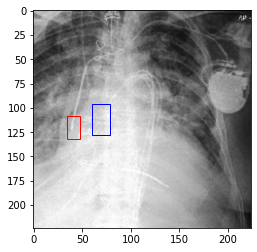

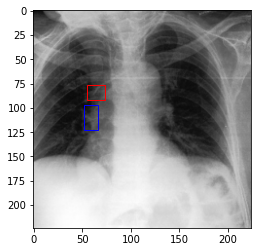

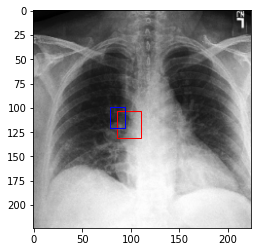

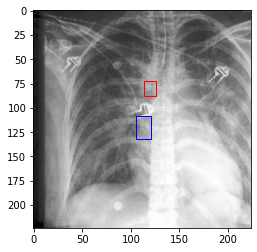

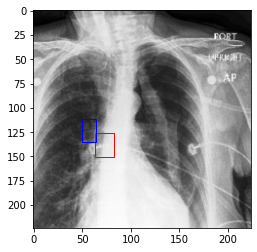

...

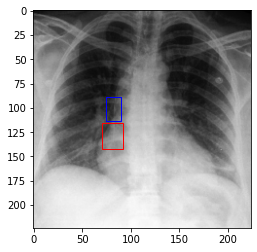

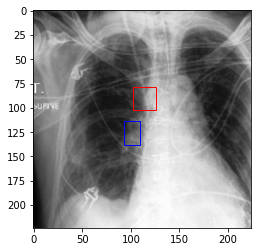

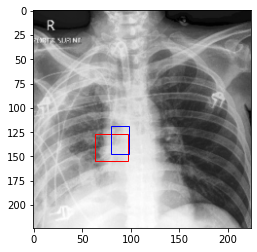

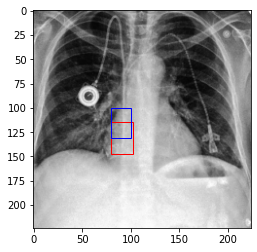

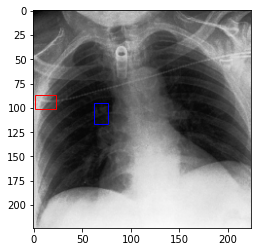

In [ ]:
grab_annotations_image_prediction(test_data, best_model, PERSONAL_DIR/"central_venous_square_cropped")

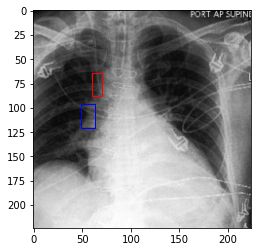

In [ ]:
test_image_on_random_example(train_data, model)

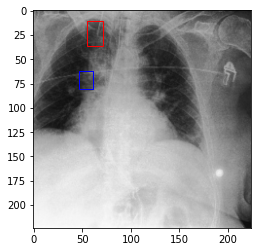

In [ ]:
test_image_on_random_example(test_data, best_model)

In [ ]:

#torch.save(best_model, PERSONAL_DIR/"best_central_venous_model_crop_aug.pth")

# Best Model Chest Tube

In [ ]:
df_chest_train.shape, df_chest_test.shape

((110, 29), (28, 29))

In [ ]:
train_transform = transforms.Compose([
  #  ImgTransform(transforms.Resize((224, 224))),
    ImgTransform(transforms.Resize(256)),
  #  ImgTransform(transforms.RandomRotation(20)),
    RandomCrop(224),
    ImgTransform(transforms.ColorJitter(0.2, 0.2, 0.2, 0.2)),
   # RandomFlip(0.5),
 #   ImgTransform(transforms.GaussianBlur(3)),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_transform = transforms.Compose([
  #  ImgTransform(transforms.Resize((224, 224))),
   # ImgTransform(transforms.RandomRotation(8)),
    ImgTransform(transforms.Resize(256)),

    CenterCrop(224),
   # ImgTransform(transforms.ColorJitter(0.2, 0.2, 0, 0)),
 #   RandomFlip(0.5),
 #   ImgTransform(transforms.GaussianBlur(3)),
    ImgTransform(transforms.ToTensor()),
    Image3Channels(),
])

In [ ]:
test_data, test_loader = create_dataset(df_chest_test, "chest_tube", test_transform, batch_size=8, shuffle=False)
train_data, train_loader = create_dataset(df_chest_train, "chest_tube", train_transform, batch_size=8, shuffle=True)

In [ ]:
def get_model():
  model = torchvision.models.resnet18(pretrained=False)
  model.fc = nn.Sequential(
      nn.Dropout(0.2),
      nn.Linear(model.fc.in_features, 256),
      nn.LeakyReLU(),
      nn.Linear(256, 4),
      nn.Sigmoid()
  )

  return model.to(device)

get_optimizer = lambda model: optim.Adam(model.parameters(), lr=1e-4)

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()
acc_metric = iou
epochs = 15

In [ ]:
get_full_training(get_model, train_loader, test_loader, get_optimizer, criterion, PERSONAL_DIR/"chest_tube_square_crop_model")

doing model /content/drive/MyDrive/Catheters/chest_tube_square_crop_model, trial 0/3
train epoch 0: avg_loss 0.05342773199081421, avg_acc 0.034998707473278046
test epoch 0: avg_loss 0.033315074763127735, avg_acc 0.0635199323296547
train epoch 1: avg_loss 0.027023393762382594, avg_acc 0.04723059758543968
test epoch 1: avg_loss 0.022576059081724713, avg_acc 0.038976918905973434
train epoch 2: avg_loss 0.024951425262472845, avg_acc 0.023955296725034714
test epoch 2: avg_loss 0.023335321939417293, avg_acc 0.015830252319574356
train epoch 3: avg_loss 0.027074115960435435, avg_acc 0.024643942713737488
test epoch 3: avg_loss 0.021047096965568408, avg_acc 0.026534946635365486
train epoch 4: avg_loss 0.025837807526642626, avg_acc 0.014954538084566593
test epoch 4: avg_loss 0.021085742861032486, avg_acc 0.034029968082904816
train epoch 5: avg_loss 0.024984053082086823, avg_acc 0.012189463712275028
test epoch 5: avg_loss 0.021561502612062862, avg_acc 0.028475908562541008
train epoch 6: avg_loss 0

In [ ]:
model = torchvision.models.resnet50(pretrained=False)
model.fc = nn.Sequential(
    nn.Dropout(0.2),
    nn.Linear(model.fc.in_features, 512),
    nn.LeakyReLU(),
    nn.Linear(512, 256),
    nn.LeakyReLU(),
    nn.Linear(256, 4),
    nn.Sigmoid()
)

model = model.to(device)

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = ciou
acc_metric = iou
epochs = 15

In [ ]:
best_acc = float("-inf")
best_model = copy.deepcopy(model)

In [ ]:
data = basic_train_model(model, train_loader, test_loader, optimizer, criterion, acc_metric, best_model=best_model, best_acc=best_acc, epochs=epochs)

train epoch 0/15, iter 0/14, case 0/110, loss 1.4947779178619385, avg_loss 1.4947779178619385, acc 9.536335028315079e-07, avg_acc 9.536335028315079e-07
train epoch 0/15, iter 1/14, case 8/110, loss 1.4065611362457275, avg_loss 1.450669527053833, acc 0.030229628086090088, avg_acc 0.015115290880203247
train epoch 0/15, iter 2/14, case 16/110, loss 1.1458985805511475, avg_loss 1.3490792115529378, acc 0.03168703615665436, avg_acc 0.0206392053514719
train epoch 0/15, iter 3/14, case 24/110, loss 0.982507050037384, avg_loss 1.2574361711740494, acc 0.021720033138990402, avg_acc 0.020909413695335388
train epoch 0/15, iter 4/14, case 32/110, loss 0.9385237693786621, avg_loss 1.193653690814972, acc 0.01001003198325634, avg_acc 0.01872953772544861
train epoch 0/15, iter 5/14, case 40/110, loss 1.0623953342437744, avg_loss 1.1717772980531056, acc 0.03537721931934357, avg_acc 0.021504150703549385
train epoch 0/15, iter 6/14, case 48/110, loss 0.7415635585784912, avg_loss 1.110318192413875, acc 0.03

In [ ]:
save_data(data, PERSONAL_DIR/"models/chest_tube_square_crop_rot_colorjit_flip")

{'best_acc': 0.06928750872612, 'train_losses': [7.52819458927427, 6.378756957394736, 6.182059075151171, 6.19661329473768, 6.495716912405832, 5.888771976743426, 5.859579520566123, 6.124654684747968, 6.27547459091459, 6.176074521882193, 6.223600268363953, 6.177095668656485, 6.0144822256905695, 6.170667265142713, 5.95191307578768], 'test_losses': [0.7289296048028129, 0.6474443844386509, 0.7080422384398324, 0.6496138913290841, 0.6943620783942086, 0.6411785653659275, 0.685624727181026, 0.6379065769059318, 0.6512396931648254, 0.6253728781427655, 0.7795706050736564, 0.6366571869168963, 0.632550128868648, 0.6583660500390189, 0.6600285683359418], 'train_accs': [0.13905033469200134, 0.07880591601133347, 0.08464138954877853, 0.09216759353876114, 0.130751371383667, 0.11382835358381271, 0.25565314292907715, 0.06567162275314331, 0.12799598276615143, 0.06685943901538849, 0.19752144813537598, 0.1914491504430771, 0.24635450541973114, 0.20895113050937653, 0.1871877759695053], 'test_accs': [0.06287067383

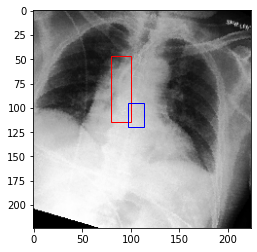

In [ ]:
test_image_on_random_example(train_data, data["model"])

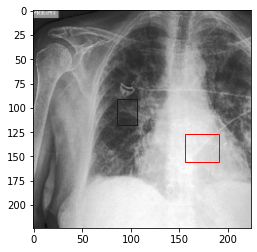

In [ ]:
test_image_on_random_example(test_data, data["best_model"])